In [70]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from astropy import units as u
from astroduet.bbmag import bb_abmag_fluence
from astroduet.image_utils import construct_image, find, ap_phot, run_daophot
from astroduet.config import Telescope
from astroduet.background import background_pixel_rate
from astroduet.utils import duet_abmag_to_fluence
from astropy.table import Table

duet = Telescope()
duet.info()

[bgd_band1, bgd_band2] = background_pixel_rate(duet, low_zodi = True, diag=True)

read_noise = duet.read_noise


# Define image simulation parameters
exposure = 300 * u.s
frame = np.array([30,30]) # Dimensions of the image I'm simulating in DUET pixels (30x30 ~ 3x3 arcmin)
psf_fwhm_pix = duet.psf_fwhm / duet.pixel

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
-----
DUET Telescope State:
Physical Entrance Pupil: 26.0 cm
Effective EPD: 24.2 cm
Effective Area: 459.9605804120816 cm2
Transmission Efficiency: 0.8166518036622619

Pixel size: 6.4 arcsec
PSF FWHM: 5.37 arcsec
Pointing jitter: 5.0 arcsec
Effective PSF FWHM: 7.337363286630968 arcsec
N_eff: 3.597839101366366

Band 1: {'eff_wave': <Quantity 202.56878682 nm>, 'eff_width': <Quantity 53.32814342 nm>}
Bandpass 1: [175.90471511 229.23285853] nm
Band 2: {'eff_wave': <Quantity 281.7531854 nm>, 'eff_width': <Quantity 68.16239088 nm>}
Bandpass 2: [247.67198996 315.83438085] nm

Read noise (RMS per read): 3
-----
-----
Background Computation Integrating over Pixel Area
Telescope diameter: 26.0 cm
Transmission Efficiency: 0.8166518036622619


Pixel Size: 6.4 arcsec
Pixel Area: 40.96000000000001 arcsec2

Zodi Level: 77
Band1 Rate: 0.030369732491096913 1 / s
Band2 Rate: 0.24785885092656168 1 / s
-----


In [50]:
from astropy.visualization import quantity_support
import matplotlib
font = {'family' : 'sans',
        'weight' : 'bold',
        'size'   : 18}

matplotlib.rc('font', **font)
plt.rcParams['figure.figsize'] = [15,8]

In [36]:
# Define sources
src_abmags = np.arange(17,24,0.1)*u.ABmag

src_fluence1 = duet_abmag_to_fluence(src_abmags, duet.bandpass1)
src_fluence2 = duet_abmag_to_fluence(src_abmags, duet.bandpass2)

src_rate1 = duet.trans_eff * duet.eff_area * src_fluence1 / u.ph
src_rate2 = duet.trans_eff * duet.eff_area * src_fluence2 / u.ph

In [37]:
# Define galaxy surface brightnesses
gal_surf_abmags = np.arange(15,25,0.25)*u.ABmag # per square arcsecond; add that in the fluence array

gal_surf_fluence1 = duet_abmag_to_fluence(gal_surf_abmags, duet.bandpass1)/u.arcsec**2
gal_surf_fluence2 = duet_abmag_to_fluence(gal_surf_abmags, duet.bandpass2)/u.arcsec**2

# Define galaxy amplitudes for sim_galaxy (convert surface brightness to countrate per pixel, for the initial oversampled pixels)
gal_pix_fluence1 = gal_surf_fluence1 * (duet.pixel/6)**2
gal_pix_fluence2 = gal_surf_fluence2 * (duet.pixel/6)**2

gal_pix_rate1 = duet.trans_eff * duet.eff_area * gal_pix_fluence1 / u.ph
gal_pix_rate2 = duet.trans_eff * duet.eff_area * gal_pix_fluence2 / u.ph

In [63]:
galaxy = 'custom'
r_eff = 30 / (duet.pixel.value/6)
gal_params = {'amplitude': gal_pix_rate2.value[0],'r_eff': r_eff,'n':1, 'x_0': r_eff, 'y_0': 0}

In [68]:
# Loop over source, galaxy magnitudes;
# Plotting arrays contain for each combination of source and galaxy magnitude:
# :,:,0 = Empty
# :,:,1 = measured rate
# :,:,2 = error
# No aperture photometry for now

# Initialise plotting arrays; 
band1_psf = np.zeros([len(gal_surf_abmags),len(src_abmags),3])
band2_psf = np.zeros([len(gal_surf_abmags),len(src_abmags),3])

#band1_ap = np.zeros([len(src_abmags),len(gal_surf_abmags),3])
#band2_ap = np.zeros([len(src_abmags),len(gal_surf_abmags),3])


#for i, galrate in enumerate(gal_pix_rate1.value):
#    gal_params = {'amplitude': galrate,'r_eff': r_eff,'n':1, 'x_0': r_eff, 'y_0': 0}
#    # Construct reference image, without source, 5 exposures
#    n_exp = 5
#    ref_image = construct_image(frame, exposure, read_noise, \
#                        gal_type=galaxy, gal_params=gal_params, source=None, sky_rate=bgd_band1, n_exp=n_exp)
#    ref_image_rate = ref_image / (n_exp * exposure.value)
#
#    for j, srcrate in enumerate(src_rate1):
#        # Construct the simulated image
#        image = construct_image(frame, exposure, read_noise,source=srcrate,
#                            gal_type=galaxy, gal_params=gal_params, 
#                            sky_rate=bgd_band1)
#        image_rate = image / exposure.value
#        
#        # Generate difference image
#        s_n, s_r = np.sqrt(image_rate), np.sqrt(ref_image_rate)
#        sn, sr = np.mean(s_n), np.mean(s_r)
#        dx, dy = 1,1
#        diff_image, d_psf, s_corr = py_zogy(image_rate,ref_image_rate,psf_array,psf_array,s_n,s_r,sn,sr,dx,dy)
#        
#        # Run find
#        star_tbl, bkg_image, threshold = find(diff_image,psf_fwhm_pix.value,method='peaks',background='sigclip')
#        
#        # Is peak successfully found? If so, go to photometry
#        if star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]:
#            #print('star found')
#            sn = star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]
#            
#            ## Perform aperture photometry
#            #result_ap, apertures, annulus_apertures = ap_phot(diff_image,sn,read_noise,exposure.value)
#            #band1_ap[i,j,1] = result_ap['aper_sum_bkgsub']
#            #band1_ap[i,j,2] = result_ap['aperture_sum_err']
#    
#            # Run PSF-fitting photometry
#            result_psf, residual_image = run_daophot(diff_image,threshold,sn,niters=1)
#            band1_psf[i,j,1] = result_psf['flux_fit']
#            band1_psf[i,j,2] = result_psf['flux_unc']
        
for i, galrate in enumerate(gal_pix_rate2.value):
    gal_params = {'amplitude': galrate,'r_eff': r_eff,'n':1, 'x_0': r_eff, 'y_0': 0}
    # Construct reference image, without source, 5 exposures
    n_exp = 5
    ref_image = construct_image(frame, exposure, read_noise, \
                        gal_type=galaxy, gal_params=gal_params, source=None, sky_rate=bgd_band2, n_exp=n_exp)
    ref_image_rate = ref_image / (n_exp * exposure.value)

    for j, srcrate in enumerate(src_rate2):
        # Construct the simulated image
        image = construct_image(frame, exposure, read_noise,source=srcrate,
                            gal_type=galaxy, gal_params=gal_params, 
                            sky_rate=bgd_band2)
        image_rate = image / exposure.value
        
        # Generate difference image
        s_n, s_r = np.sqrt(image_rate), np.sqrt(ref_image_rate)
        sn, sr = np.mean(s_n), np.mean(s_r)
        dx, dy = 1,1
        diff_image, d_psf, s_corr = py_zogy(image_rate,ref_image_rate,psf_array,psf_array,s_n,s_r,sn,sr,dx,dy)
        
        # Run find
        star_tbl, bkg_image, threshold = find(diff_image,psf_fwhm_pix.value,method='peaks',background='sigclip')
        
        # Is peak successfully found? If so, go to photometry
        if star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]: 
            sn = star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]
            
            ## Perform aperture photometry
            #result_ap, apertures, annulus_apertures = ap_phot(diff_image,sn,read_noise,exposure.value)
            #band2_ap[i,j,1] = result_ap['aper_sum_bkgsub']
            #band2_ap[i,j,2] = result_ap['aperture_sum_err']
    
            # Run PSF-fitting photometry
            result_psf, residual_image = run_daophot(diff_image,threshold,sn,niters=1)
            band2_psf[i,j,1] = result_psf['flux_fit']
            band2_psf[i,j,2] = result_psf['flux_unc']

PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


/Users/mheida/software/miniconda2/envs/duet/lib/python3.6/site-packages/photutils/psf/photometry.py:431: RuntimeWarning: invalid value encountered in sqrt
  self.fitter.fit_info['param_cov'])


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


In [111]:
# Save output!
outputarr = np.zeros([len(gal_surf_abmags),len(src_abmags),8])
for i in range(len(src_abmags)):
    outputarr[:,i,0] = gal_surf_abmags.value
for i in range(len(gal_surf_abmags)):
    outputarr[i,:,1] = src_abmags.value
    outputarr[i,:,2] = src_rate1.value
    outputarr[i,:,5] = src_rate2.value
outputarr[:,:,3:5] = band1_psf[:,:,1:3]
outputarr[:,:,6:8] = band2_psf[:,:,1:3]
newarr = np.reshape(outputarr,[len(gal_surf_abmags)*len(src_abmags),8]).transpose()
outtab = Table([newarr[0],newarr[1],newarr[2],newarr[3],newarr[4],newarr[5],newarr[6],newarr[7]],
                  names=('galmag', 'srcmag', 'src_rate_in_D1', 'src_rate_psf_D1', 'src_rate_psf_D1_err', 'src_rate_in_D2', 'src_rate_psf_D2', 'src_rate_psf_D2_err'), 
                  meta={'name': 'Measured count rates for src mag vs galaxy surface brightness'})
outtab.write('../astroduet/data/src_rate_vs_gal_surfacebrightness.fits', format='fits', overwrite=True)

/Users/mheida/software/miniconda2/envs/duet/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


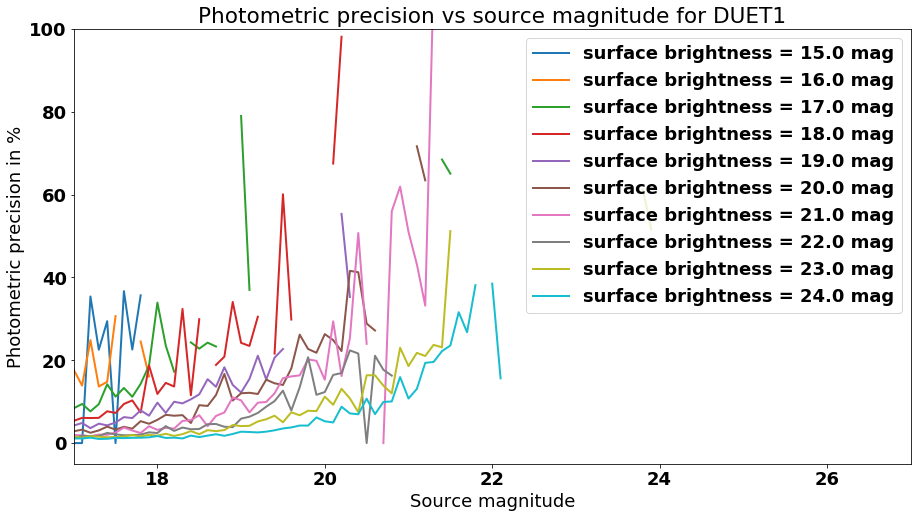

In [55]:
# Plot stuff
for i,galmag in enumerate(gal_surf_abmags[::4]):
    plt.plot(src_abmags.value,band1_psf[4*i,:,2]/np.abs(band1_psf[4*i,:,1])*100,linewidth=2,label='surface brightness = '+str(galmag.value)+' mag')

plt.ylim(-5,100)  
plt.xlim(17,27)
plt.legend()    
plt.title('Photometric precision vs source magnitude for DUET1')
plt.xlabel('Source magnitude')
plt.ylabel('Photometric precision in %')
plt.show()

/Users/mheida/software/miniconda2/envs/duet/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


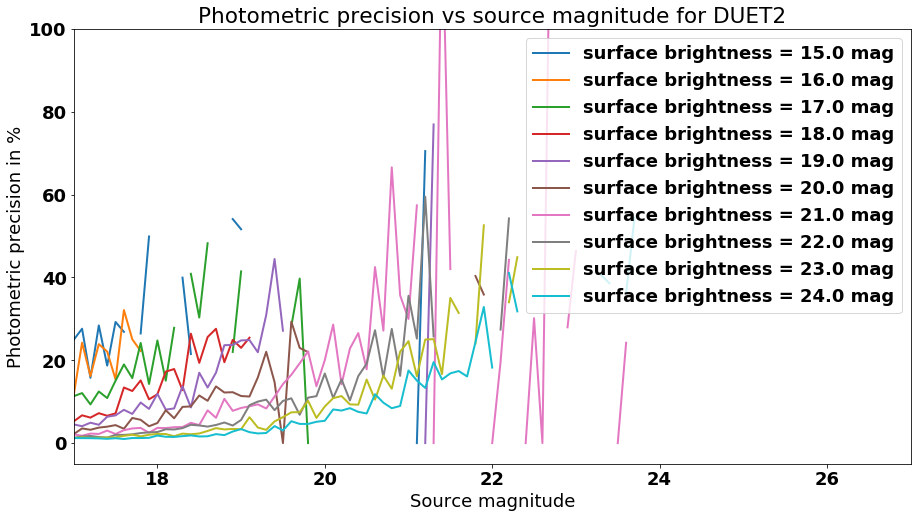

In [112]:
# Plot stuff
for i,galmag in enumerate(gal_surf_abmags[::4]):
    plt.plot(src_abmags,band2_psf[4*i,:,2]/np.abs(band2_psf[4*i,:,1])*100,linewidth=2,label='surface brightness = '+str(galmag.value)+' mag')

    
plt.ylim(-5,100)  
plt.xlim(17,27)
plt.legend()    
plt.title('Photometric precision vs source magnitude for DUET2')
plt.xlabel('Source magnitude')
plt.ylabel('Photometric precision in %')
plt.show()

In [ ]:
# Refine:
# Plotting arrays contain for each galaxy magnitude:
# :,0 = input source magnitude
# :,1 = percentage of sources that is detected at 5 sigma
# :,2 = average measured rate
# :,3 = average error

# This takes a long time to run!
nsrc = 50 # number of 0.1 mag steps for source magnitudes
ntry = 100 # nubmer of sources to simulate at every source magnitude

# Initialise plotting arrays; 
band1_psf_lim = np.zeros([len(gal_surf_abmags[::4]),nsrc,5])
band2_psf_lim = np.zeros([len(gal_surf_abmags[::4]),nsrc,5])

#band1_ap = np.zeros([len(src_abmags),len(gal_surf_abmags),3])
#band2_ap = np.zeros([len(src_abmags),len(gal_surf_abmags),3])

for i, galrate in enumerate(gal_pix_rate1.value[::4]):
    gal_params = {'amplitude': galrate,'r_eff': r_eff,'n':1, 'x_0': r_eff, 'y_0': 0}
    # Construct reference image, without source, 5 exposures
    n_exp = 5
    ref_image = construct_image(frame, exposure, read_noise, \
                        gal_type=galaxy, gal_params=gal_params, source=None, sky_rate=bgd_band1, n_exp=n_exp)
    ref_image_rate = ref_image / (n_exp * exposure.value)
    # Define sources
    srcabmags = np.linspace(gal_surf_abmags.value[i*4]-2.5,gal_surf_abmags.value[i*4]+2.5,nsrc)*u.ABmag
    srcfluence = duet_abmag_to_fluence(srcabmags, duet.bandpass1)
    src_rate = duet.trans_eff * duet.eff_area * srcfluence / u.ph
    for j,srcrate in enumerate(src_rate):
        temparr = np.zeros([ntry,3])
        for k in range(ntry):
            # Construct the simulated image
            image = construct_image(frame, exposure, read_noise,source=srcrate,
                                gal_type=galaxy, gal_params=gal_params, 
                                sky_rate=bgd_band1)
            image_rate = image / exposure.value
            
            # Generate difference image
            s_n, s_r = np.sqrt(image_rate), np.sqrt(ref_image_rate)
            sn, sr = np.mean(s_n), np.mean(s_r)
            dx, dy = 1,1
            diff_image, d_psf, s_corr = py_zogy(image_rate,ref_image_rate,psf_array,psf_array,s_n,s_r,sn,sr,dx,dy)
            
            # Run find
            star_tbl, bkg_image, threshold = find(diff_image,psf_fwhm_pix.value,method='peaks',background='sigclip')
            
            # Is peak successfully found? If so, go to photometry
            if star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]:
                temparr[k,0]=1
                sn = star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]
                
                # Run PSF-fitting photometry
                result_psf, residual_image = run_daophot(diff_image,threshold,sn,niters=1)
                temparr[k,1] = result_psf['flux_fit']
                temparr[k,2] = result_psf['flux_unc']
                
        # Get percentage of detected sources and average countrates and errors
        band1_psf_lim[i,j,0] = srcabmags.value[j]
        band1_psf_lim[i,j,1] = srcrate.value
        band1_psf_lim[i,j,2] = np.sum(temparr[:,0])/ntry
        band1_psf_lim[i,j,3] = np.mean(temparr[:,1][temparr[:,0] == 1])
        band1_psf_lim[i,j,4] = np.mean(np.abs(temparr[:,2][temparr[:,0] == 1]))
        
for i, galrate in enumerate(gal_pix_rate2.value[::4]):
    gal_params = {'amplitude': galrate,'r_eff': r_eff,'n':1, 'x_0': r_eff, 'y_0': 0}
    # Construct reference image, without source, 5 exposures
    n_exp = 5
    ref_image = construct_image(frame, exposure, read_noise, \
                        gal_type=galaxy, gal_params=gal_params, source=None, sky_rate=bgd_band2, n_exp=n_exp)
    ref_image_rate = ref_image / (n_exp * exposure.value)
    # Define sources
    srcabmags = np.linspace(gal_surf_abmags.value[i*4]-2.5,gal_surf_abmags.value[i*4]+2.5,nsrc)*u.ABmag
    srcfluence = duet_abmag_to_fluence(srcabmags, duet.bandpass2)
    src_rate = duet.trans_eff * duet.eff_area * srcfluence / u.ph
    for j,srcrate in enumerate(src_rate):
        temparr = np.zeros([ntry,3])
        for k in range(ntry):
            # Construct the simulated image
            image = construct_image(frame, exposure, read_noise,source=srcrate,
                                gal_type=galaxy, gal_params=gal_params, 
                                sky_rate=bgd_band2)
            image_rate = image / exposure.value
            
            # Generate difference image
            s_n, s_r = np.sqrt(image_rate), np.sqrt(ref_image_rate)
            sn, sr = np.mean(s_n), np.mean(s_r)
            dx, dy = 1,1
            diff_image, d_psf, s_corr = py_zogy(image_rate,ref_image_rate,psf_array,psf_array,s_n,s_r,sn,sr,dx,dy)
            
            # Run find
            star_tbl, bkg_image, threshold = find(diff_image,psf_fwhm_pix.value,method='peaks',background='sigclip')
            
            # Is peak successfully found? If so, go to photometry
            if star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]:
                temparr[k,0]=1
                sn = star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]
                
                # Run PSF-fitting photometry
                result_psf, residual_image = run_daophot(diff_image,threshold,sn,niters=1)
                temparr[k,1] = result_psf['flux_fit']
                temparr[k,2] = result_psf['flux_unc']
                
        # Get percentage of detected sources and average countrates and errors
        band2_psf_lim[i,j,0] = srcabmags.value[j]
        band2_psf_lim[i,j,1] = srcrate.value
        band2_psf_lim[i,j,2] = np.sum(temparr[:,0])/ntry
        band2_psf_lim[i,j,3] = np.mean(temparr[:,1][temparr[:,0] == 1])
        band2_psf_lim[i,j,4] = np.mean(np.abs(temparr[:,2][temparr[:,0] == 1]))

PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


/Users/mheida/software/miniconda2/envs/duet/lib/python3.6/site-packages/photutils/psf/photometry.py:431: RuntimeWarning: invalid value encountered in sqrt
  self.fitter.fit_info['param_cov'])


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


/Users/mheida/software/miniconda2/envs/duet/lib/python3.6/site-packages/photutils/psf/photometry.py:431: RuntimeWarning: invalid value encountered in sqrt
  self.fitter.fit_info['param_cov'])


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


/Users/mheida/software/miniconda2/envs/duet/lib/python3.6/site-packages/photutils/psf/photometry.py:431: RuntimeWarning: invalid value encountered in sqrt
  self.fitter.fit_info['param_cov'])


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


WARNING

PSF-fitting complete


: Both init_guesses and finder are different than None, which is ambiguous. finder is going to be ignored. [photutils.psf.photometry]


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


/Users/mheida/software/miniconda2/envs/duet/lib/python3.6/site-packages/photutils/psf/photometry.py:431: RuntimeWarning: invalid value encountered in sqrt
  self.fitter.fit_info['param_cov'])


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


WARNING

PSF-fitting complete


: Both init_guesses and finder are different than None, which is ambiguous. finder is going to be ignored. [photutils.psf.photometry]


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


WARNING

PSF-fitting complete


: Both init_guesses and finder are different than None, which is ambiguous. finder is going to be ignored. [photutils.psf.photometry]


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


WARNING

PSF-fitting complete


: Both init_guesses and finder are different than None, which is ambiguous. finder is going to be ignored. [photutils.psf.photometry]


PSF-fitting complete
PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


PSF-fitting complete


In [136]:
# Save output!
outputarr2 = np.zeros([10,50,10])
for i in range(50):
    outputarr2[:,i,0] = gal_surf_abmags[::4].value
outputarr2[:,:,1:6] = band1_psf_lim
outputarr2[:,:,6:10] = band2_psf_lim[:,:,1:5]
newarr2 = np.reshape(outputarr2,[500,10]).transpose()
outtab2 = Table([newarr2[0],newarr2[1],newarr2[2],newarr2[3],newarr2[4],newarr2[5],newarr2[6],newarr2[7],newarr2[8],newarr2[9]],
                  names=('galmag', 'srcmag', 'src_rate_in_D1', 'src_det_D1','av_src_rate_psf_D1', 'av_src_rate_psf_D1_err', 'src_rate_in_D2', 'src_det_D2', 'av_src_rate_psf_D2', 'av_src_rate_psf_D2_err'), 
                  meta={'name': 'Detection limits for src mag vs galaxy surface brightness'})
outtab2.write('../astroduet/data/src_det_vs_gal_surfacebrightness.fits', format='fits', overwrite=True)

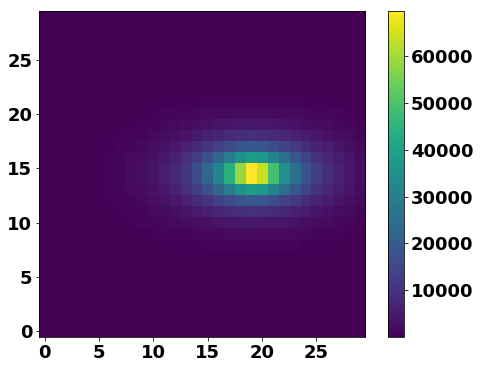

In [64]:
# Construct the simulated image
image = construct_image(frame, exposure, read_noise,source=src_rate2[0],
                        gal_type=galaxy, gal_params=gal_params, 
                        sky_rate=bgd_band2)

image_rate = image / exposure.value
plt.figure(figsize=[8,6])
plt.imshow(image_rate, cmap='viridis', aspect=1, origin='lower')
plt.colorbar()

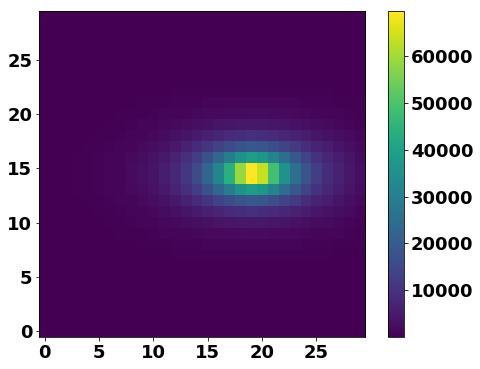

In [65]:
# Part 2, simulate reference image, without source, 5 exposures
# Currently a perfect co-add
n_exp = 5
ref_image = construct_image(frame, exposure, read_noise, \
                            gal_type=galaxy, gal_params=gal_params, source=None, sky_rate=bgd_band2, n_exp=n_exp)
ref_image_rate = ref_image / (n_exp * exposure.value)
plt.figure(figsize=[8,6])
plt.imshow(ref_image_rate, cmap='viridis', aspect=1, origin='lower')
plt.colorbar()

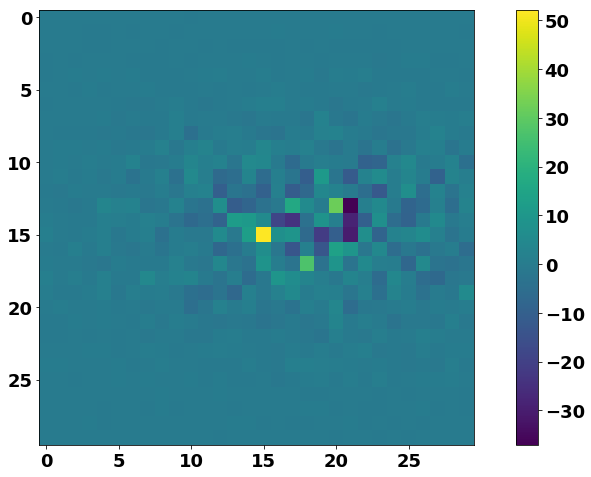

In [66]:
# Part 3, make a difference image

from astroduet.diff_image import py_zogy

# Make a 2D array containing the PSF (oversample then bin up for more accurate PSF)

oversample = 5
pixel_size_init = duet.pixel / oversample

psf_model = duet.psf_model(pixel_size=pixel_size_init, x_size=25, y_size=25)

psf_os = psf_model.array

#psf_os = gaussian_psf(psf_fwhm,(25,25),pixel_size_init)
shape = (5, 5, 5, 5)
psf_array = psf_os.reshape(shape).sum(-1).sum(1)

# Use ZOGY algorithm to create difference image
s_n, s_r = np.sqrt(image_rate), np.sqrt(ref_image_rate) # 2D uncertainty (sigma) - that is, noise on the background
sn, sr = np.mean(s_n), np.mean(s_r) # Average uncertainty (sigma)
dx, dy = 0.1, 0.01 # Astrometric uncertainty (sigma)
diff_image, d_psf, s_corr = py_zogy(image_rate,ref_image_rate,psf_array,psf_array,s_n,s_r,sn,sr,dx,dy)

plt.imshow(diff_image)
plt.colorbar()

Real source count rate: 85.87869846500311 1 / s
Aperture photometry complete
xcenter ycenter aperture_sum aper_sum_bkgsub aperture_sum_err percent_error
  pix     pix                                                              
------- ------- ------------ --------------- ---------------- -------------
     15      15    78.897508       94.250471       0.54781841    0.58123679
PSF-fitting complete
 id      flux_fit          flux_unc       percent_error  
--- ----------------- ----------------- -----------------
  1 80.70086049232825 15.59510097848998 19.32457830480322


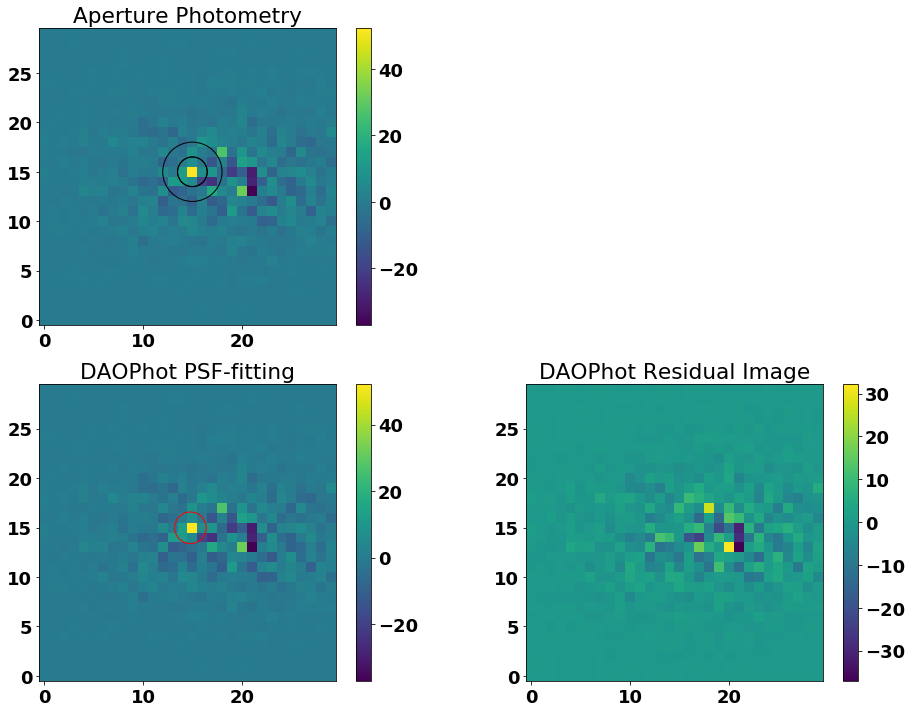

In [67]:
# Part 4, find and photometry on the difference image
print("Real source count rate: {}".format(src_rate1[0]))

# Run find
star_tbl, bkg_image, threshold = find(diff_image,psf_fwhm_pix.value,method='peaks',background='sigclip')

## Run aperture photometry
#result, apertures, annulus_apertures = ap_phot(diff_image,star_tbl,read_noise,exposure.value)
#result['percent_error'] = result['aperture_sum_err'] / result['aper_sum_bkgsub'] * 100
#print(result['xcenter','ycenter','aperture_sum','aper_sum_bkgsub','aperture_sum_err','percent_error'])
#
#print("\n")
#
## Run PSF-fitting photometry
#result, residual_image = run_daophot(diff_image,threshold,star_tbl,niters=1)
#result['percent_error'] = result['flux_unc'] / result['flux_fit'] * 100
#print(result['id','flux_fit','flux_unc','percent_error'])


# Is peak successfully found? If so, go to photometry
if star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]: 
    sn = star_tbl[(star_tbl['x']==15) & (star_tbl['y']==15)]
    
    # Perform aperture photometry
    result, apertures, annulus_apertures = ap_phot(diff_image,sn,read_noise,exposure.value)
    result['percent_error'] = result['aperture_sum_err'] / result['aper_sum_bkgsub'] * 100
    print(result['xcenter','ycenter','aperture_sum','aper_sum_bkgsub','aperture_sum_err','percent_error'])
    
    # Run PSF-fitting photometry
    result, residual_image = run_daophot(diff_image,threshold,sn,niters=1)
    result['percent_error'] = result['flux_unc'] / result['flux_fit'] * 100
    print(result['id','flux_fit','flux_unc','percent_error'])



# Plots
plt.figure(figsize=[16,12])
plt.subplot(221)
plt.title('Aperture Photometry')
plt.imshow(diff_image, cmap='viridis', aspect=1, origin='lower')
plt.colorbar()
apertures.plot()
annulus_apertures.plot()

plt.subplot(223)
plt.title('DAOPhot PSF-fitting')
plt.imshow(diff_image, cmap='viridis', aspect=1, origin='lower')
plt.colorbar()
plt.scatter(result['x_fit'],result['y_fit'],marker='o',s=1000,facecolors='none',edgecolors='r',lw=1)

plt.subplot(224)
plt.title('DAOPhot Residual Image')
plt.imshow(residual_image, cmap='viridis', aspect=1, origin='lower')
plt.colorbar()